# Import Libraries

In [2]:
import geopandas as gpd
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
import contextily as ctx
from sodapy import Socrata
import urllib.request, json

import seaborn as sns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy as np

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


# Import Census Data

In [3]:
gdf = gpd.read_file('data/acs2019_5yr_B08134_14000US06037432102.geojson')

In [4]:
gdf.head()

,geoid,name,B08134001,"B08134001, Error",B08134002,"B08134002, Error",B08134003,"B08134003, Error",B08134004,"B08134004, Error",...,"B08134116, Error",B08134117,"B08134117, Error",B08134118,"B08134118, Error",B08134119,"B08134119, Error",B08134120,"B08134120, Error",geometry
0,05000US06037,"Los Angeles County, CA",4542723.0,10252.0,297163.0,4447.0,458576.0,4846.0,602960.0,5066.0,...,504.0,18038.0,1006.0,6905.0,606.0,7715.0,719.0,12711.0,723.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1945.0,257.0,86.0,74.0,82.0,67.0,115.0,63.0,...,12.0,1.0,2.0,0.0,12.0,0.0,12.0,24.0,35.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",1757.0,174.0,9.0,16.0,17.0,20.0,39.0,49.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",2928.0,425.0,280.0,202.0,277.0,127.0,310.0,146.0,...,17.0,16.0,26.0,0.0,17.0,0.0,17.0,30.0,39.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1525.0,183.0,58.0,32.0,151.0,66.0,221.0,79.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,15.0,21.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."


# Creating Data Frames

Using Metro Ridership Statistics and Metro Survey Research

Weekday Bus vs Rail Ridership

Hypothesis: Bus Ridership is greater than Rail Ridership - Primarily because of the greater number of stops.
* Bus Stops = 13,987
* Rail Stations = 98

Survey data is in percents.

In [5]:
bus_rail = pd.DataFrame({'Time Period': ['2020/01','2020/02', 
              '2020/03', 
              '2020/04', 
              '2020/05', 
              '2020/06', 
              '2020/07', 
              '2020/08',
              '2020/09',
              '2020/10',
              '2020/11',
              '2020/12',
              '2021/01',
              '2021/02'
             ],
                         'Bus Ridership': [816652, 871496, 563759, 269382, 323231, 386332, 
                                           420745, 437154, 457138, 465249, 461722, 
                                           422979, 378630, 421247],
                                           
                         'Rail Ridership': [316583, 321444, 192463, 94421, 110825, 
                                            132532, 124692, 123329, 130053, 133731, 
                                            131235, 115079, 110429, 116261]})
bus_rail.sample()

,Time Period,Bus Ridership,Rail Ridership
3,2020/04,269382,94421


In [6]:
# What is your ethnicity?
survey_race = pd.DataFrame({'Time Period': ['Fall 2019','Spring 2019', 
              'Fall 2018', 
              'Spring 2018', 
              'Fall 2017', 
              'Spring 2016', 
              'Spring 2015'],
                         'Latino':[66,63,63,60,66,62,63],
                         'African American':[15,15,20,16,15,18,17],
                         'White':[8,8,8,9,8,9,8],
                         'API':[7,8,7,9,7,7,8],
                         'Native American':[1,1,1,1,1,1,1],   
                         'Other':[4,5,0,6,4,4,3]})

In [7]:
# Household's total annual earnings?
survey_hhinc = pd.DataFrame({'Time Period': ['Fall 2019','Spring 2019', 
              'Fall 2018', 
              'Spring 2018', 
              'Fall 2017', 
              'Spring 2016', 
              'Spring 2015'],
                         '<$5K':[25,25,24,23,28,25,30],
                         '$5K to $10K':[8,9,10,10,9,13,10],
                         '$10K to $15K':[7,6,9,9,10,11,10],
                         '$15K to $20K':[18,18,16,16,15,16,17],
                         '$20K to $25K':[11,11,13,10,12,13,9],
                         '$25K to $35K':[7,7,7,8,7,7,6],
                         '$35K to $50K':[11,11,9,10,9,8,8],
                         '$50K to $100K':[10,10,9,9,8,7,7],    
                         '$100K+':[4,3,3,4,3,3,3]})

In [8]:
# What is your age?
survey_age = pd.DataFrame({'Time Period': ['Fall 2019','Spring 2019', 
              'Fall 2018', 
              'Spring 2018', 
              'Fall 2017', 
              'Spring 2016', 
              'Spring 2015'],
                         '<18':[14,11,11,12,11,12,12],
                         '18-24':[20,16,19,17,18,17,19],
                         '25-34':[17,19,20,19,19,20,19],
                         '35-49':[21,23,22,24,24,25,24],
                         '50-64':[19,21,21,21,20,20,20],   
                         '65+':[8,9,8,9,7,7,7]})

In [9]:
# How did you get to the first bus or train of this trip?
survey_access = pd.DataFrame({'Time Period': ['Fall 2019','Spring 2019', 
              'Fall 2018', 
              'Spring 2018', 
              'Fall 2017', 
              'Spring 2016', 
              'Spring 2015'],
                         'Walk':[82,84,82,83,84,84,83],
                         'Drop off':[9,9,9,8,8,8,8],
                         'Drive':[2,2,2,4,2,2,2],
                         'Bike':[2,2,2,3,2,2,3],     
                         'Skateboard':[1,1,2,1,1,1,2],   
                         'Other':[4,3,3,2,3,3,3]})

In [10]:
# How many days a week do you usually ride Metro?
survey_daw = pd.DataFrame({'Time Period': ['Fall 2019','Spring 2019', 
              'Fall 2018', 
              'Spring 2018', 
              'Fall 2017', 
              'Spring 2016', 
              'Spring 2015'],
                         'First Time':[1,1,2,1,1,1,2],
                         '<1 day':[2,3,2,3,2,3,4],
                         '1-2 days':[6,7,7,7,6,7,8],
                         '3-4 days':[21,19,22,18,19,20,18],   
                         '5+ days':[71,71,66,71,72,70,69]})

In [11]:
# How many years have you been riding Metro?
survey_withM = pd.DataFrame({'Time Period': ['Fall 2019','Spring 2019', 
              'Fall 2018', 
              'Spring 2018', 
              'Fall 2017', 
              'Spring 2016', 
              'Spring 2015'],
                         '<1 year':[12,9,8,9,8,7,10],
                         '1-2 years':[14,16,16,16,14,15,15],
                         '3-4 years':[15,15,16,15,16,16,15],   
                         '5+ years':[60,60,60,60,62,63,60]})

In [67]:
# Fall 2019 Survey Comparisons
br_inc = pd.DataFrame({'Mode': ['Bus','Rail'],
                         '<$5K':[25,18],
                         '$5K to $10K':[8,5],
                         '$10K to $15K':[7,4],
                         '$15K to $20K':[18,13],
                         '$20K to $25K':[11,8],
                         '$25K to $35K':[7,6],
                         '$35K to $50K':[11,12],
                         '$50K to $100K':[10,18],    
                         '$100K+':[4,16]})
br_inc

,Mode,<$5K,$5K to $10K,$10K to $15K,$15K to $20K,$20K to $25K,$25K to $35K,$35K to $50K,$50K to $100K,$100K+
0,Bus,25,8,7,18,11,7,11,10,4
1,Rail,18,5,4,13,8,6,12,18,16


In [59]:
br_race = pd.DataFrame({'Mode': ['Bus','Rail'],
                        'Latino':[66,44],
                         'African American':[15,18],
                         'White':[8,21],
                         'API':[7,11],
                         'Native American':[1,1],   
                         'Other':[4,6]})
br_race

,Mode,Latino,African American,White,API,Native American,Other
0,Bus,66,15,8,7,1,4
1,Rail,44,18,21,11,1,6


In [14]:
br_age = pd.DataFrame({'Mode': ['Bus','Rail'],
                       '<18':[14,5],
                         '18-24':[20,22],
                         '25-34':[17,26],
                         '35-49':[21,23],
                         '50-64':[19,17],   
                         '65+':[8,7]})

In [69]:
br_access = pd.DataFrame({'Mode': ['Bus','Rail'],
                          'Walk':[82,60],
                         'Drop off':[9,14],
                         'Drive':[2,13],
                         'Bike':[2,4],     
                         'Skateboard':[1,2],   
                         'Other':[4,7]})
list(br_access)

['Mode', 'Walk', 'Drop off', 'Drive', 'Bike', 'Skateboard', 'Other']

May need to transpose all data.

# Park Data

Importing and Normalizing

In [16]:
parks_url = 'https://opendata.arcgis.com/datasets/0eb692c964734202860a211fa6bbbee8_12.geojson'

with urllib.request.urlopen(parks_url) as url:
    data = json.loads(url.read().decode())

data

{'type': 'FeatureCollection',
 'name': 'Countywide_Parks_and_Open_Space_(Public_-_Hosted)',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'OBJECTID': 1,
    'UNIT_ID': 30,
    'LMS_ID': 23603,
    'PARK_NAME': 'El Barrio Park',
    'PARK_LBL': 'El Barrio Park',
    'ACCESS_TYP': 'Open Access',
    'RPT_ACRES': 2.093,
    'GIS_ACRES': 2.09299189,
    'AGNCY_NAME': 'Claremont, City of',
    'AGNCY_LEV': 'City',
    'AGNCY_TYP': 'City Agency',
    'AGNCY_WEB': 'http://www.ci.claremont.ca.us/ps.leisurerecreation.cfm?ID=1709',
    'MNG_AGENCY': 'Claremont, City of',
    'COGP_TYP': 'Pocket Park',
    'NDS_AN_TYP': 'Park < 5 Acres',
    'NEEDS_ANLZ': 'Yes',
    'TKIT_SUM': 'Yes',
    'AMEN_RPT': 'Yes',
    'PRKINF_CND': 'Fair',
    'AM_OPNSP': 'Present - Fair',
    'AM_TRLS': 'None',
    'TRLS_MI': 0.0,
    'TENIS': 0,
    'BSKTB': 1,
    'BASEB': 0,
    'SOCCR': 0,
    'MPFLD': 1,
    'FITZN': 0,
    

In [17]:
parks = pd.json_normalize(data,'features')
parks.sample()

,type,properties.OBJECTID,properties.UNIT_ID,properties.LMS_ID,properties.PARK_NAME,properties.PARK_LBL,properties.ACCESS_TYP,properties.RPT_ACRES,properties.GIS_ACRES,properties.AGNCY_NAME,...,properties.ADDRESS,properties.CITY,properties.ZIP,properties.HOURS,properties.PHONES,properties.IS_COUNTY,properties.Shape__Area,properties.Shape__Length,geometry.type,geometry.coordinates
2570,Feature,2626,46292,NaN,Unnamed site - Mountains Recreation and Conser...,,Unknown Access,15.498,15.496771,Mountains Recreation and Conservation Authority,...,None,Chatsworth,91311,None,None,No,675036.623047,6933.012819,Polygon,"[[[-118.603918469951, 34.2895989045683], [-118..."


In [18]:
list(parks)

['type',
 'properties.OBJECTID',
 'properties.UNIT_ID',
 'properties.LMS_ID',
 'properties.PARK_NAME',
 'properties.PARK_LBL',
 'properties.ACCESS_TYP',
 'properties.RPT_ACRES',
 'properties.GIS_ACRES',
 'properties.AGNCY_NAME',
 'properties.AGNCY_LEV',
 'properties.AGNCY_TYP',
 'properties.AGNCY_WEB',
 'properties.MNG_AGENCY',
 'properties.COGP_TYP',
 'properties.NDS_AN_TYP',
 'properties.NEEDS_ANLZ',
 'properties.TKIT_SUM',
 'properties.AMEN_RPT',
 'properties.PRKINF_CND',
 'properties.AM_OPNSP',
 'properties.AM_TRLS',
 'properties.TRLS_MI',
 'properties.TENIS',
 'properties.BSKTB',
 'properties.BASEB',
 'properties.SOCCR',
 'properties.MPFLD',
 'properties.FITZN',
 'properties.SK8PK',
 'properties.PCNIC',
 'properties.PLGND',
 'properties.POOLS',
 'properties.SPPAD',
 'properties.DGPRK',
 'properties.GYM',
 'properties.COMCT',
 'properties.SNRCT',
 'properties.RSTRM',
 'properties.TOTAL_GOOD',
 'properties.TOTAL_FAIR',
 'properties.TOTAL_POOR',
 'properties.TYPE',
 'properties.CENTE

In [19]:
kp_columns = ['type',
 'properties.PARK_NAME',
 'properties.GIS_ACRES',
 'properties.COGP_TYP',
 'properties.TYPE',
 'properties.CENTER_LAT',
 'properties.CENTER_LON',
 'properties.IS_COUNTY',
 'properties.Shape__Area',
 'properties.Shape__Length',
 'geometry.type',
 'geometry.coordinates']
parks = parks[kp_columns]
parks.sample()

,type,properties.PARK_NAME,properties.GIS_ACRES,properties.COGP_TYP,properties.TYPE,properties.CENTER_LAT,properties.CENTER_LON,properties.IS_COUNTY,properties.Shape__Area,properties.Shape__Length,geometry.type,geometry.coordinates
184,Feature,Los Encinos SHP,5.271815,Neighborhood Park,Local Park,34.159971,-118.499072,No,229639.342773,2074.164201,Polygon,"[[[-118.498546238771, 34.1594448536459], [-118..."


In [20]:
parks_rrp = parks.loc[parks['properties.TYPE'] == 'Regional Recreation Park']
list(parks_rrp)

['type',
 'properties.PARK_NAME',
 'properties.GIS_ACRES',
 'properties.COGP_TYP',
 'properties.TYPE',
 'properties.CENTER_LAT',
 'properties.CENTER_LON',
 'properties.IS_COUNTY',
 'properties.Shape__Area',
 'properties.Shape__Length',
 'geometry.type',
 'geometry.coordinates']

In [21]:
parks_rrp

,type,properties.PARK_NAME,properties.GIS_ACRES,properties.COGP_TYP,properties.TYPE,properties.CENTER_LAT,properties.CENTER_LON,properties.IS_COUNTY,properties.Shape__Area,properties.Shape__Length,geometry.type,geometry.coordinates
11,Feature,Elysian Park,575.947710,Regional Park,Regional Recreation Park,34.082591,-118.238876,No,2.508818e+07,66882.562034,MultiPolygon,"[[[[-118.237783189307, 34.0890758608004], [-11..."
64,Feature,Hansen Dam Park,419.595082,Regional Park,Regional Recreation Park,34.269027,-118.389161,No,1.827749e+07,38610.054845,MultiPolygon,"[[[[-118.380217997051, 34.2743490632761], [-11..."
131,Feature,Lake Balboa Park,110.965315,Regional Park,Regional Recreation Park,34.181696,-118.493951,No,4.833630e+06,16016.227452,MultiPolygon,"[[[[-118.492552240122, 34.1852718562664], [-11..."
378,Feature,Ken Malloy Harbor RP and Golf Course,291.710193,Regional Park,Regional Recreation Park,33.784925,-118.289878,No,1.270685e+07,27363.404345,Polygon,"[[[-118.291689174133, 33.7908548241863], [-118..."
763,Feature,Peter F Schabarum Regional County Park,575.493261,Regional,Regional Recreation Park,33.979469,-117.932628,Yes,2.506839e+07,31794.150321,MultiPolygon,"[[[[-117.930552129799, 33.9908758669772], [-11..."
772,Feature,Heartwell Park,111.264869,Regional Park,Regional Recreation Park,33.831234,-118.120719,No,4.846678e+06,19597.215263,MultiPolygon,"[[[[-118.107911488935, 33.830315937671], [-118..."
794,Feature,El Dorado East Regional Park,354.216296,Regional Park,Regional Recreation Park,33.818766,-118.086569,No,1.542960e+07,24858.006905,MultiPolygon,"[[[[-118.092328143208, 33.8282248400264], [-11..."
830,Feature,El Dorado Park West,116.639712,Regional Park,Regional Recreation Park,33.804738,-118.096817,No,5.080806e+06,19480.113461,MultiPolygon,"[[[[-118.097007900047, 33.8103026230845], [-11..."
855,Feature,Hahamongna Watershed Park,303.349036,Regional Park,Regional Recreation Park,34.193350,-118.172429,No,1.321383e+07,20301.897329,Polygon,"[[[-118.165255349254, 34.2028643606888], [-118..."
986,Feature,Griffith Park (City of Los Angeles),4065.883452,Regional Park,Regional Recreation Park,34.135473,-118.298554,No,1.771092e+08,199801.123666,MultiPolygon,"[[[[-118.300378839131, 34.1560702659913], [-11..."


# Analysis

## Census Data

The data is lining up with the listed columns. Will troubleshoot this later if there is time.

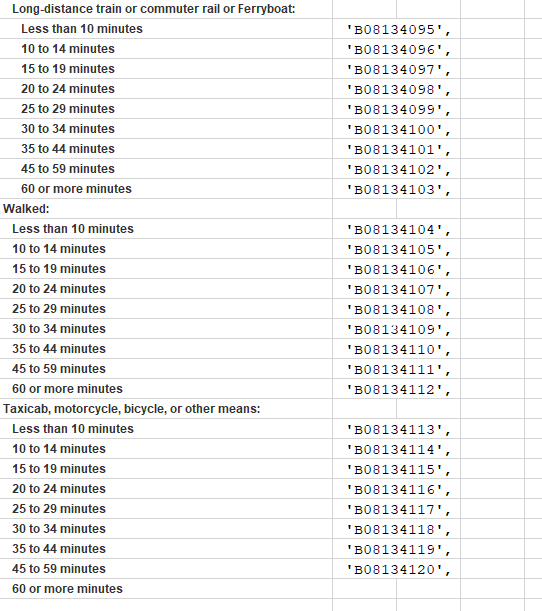

In [22]:
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [23]:
#gdf = gdf.drop([0])

In [24]:
#list(gdf)

In [25]:
#columns_to_keep1 = ['geoid',
 #'name',
 #'B08134010', #car
 #'B08134060', #public
 #'B08134100', #taxi
 #'B08134110', #walk
 #'geometry']

In [26]:
#gdf_mc = gdf[columns_to_keep1]

In [27]:
#gdf_mc.head()

In [28]:
#gdf_mc.columns = ['geoid',
 #'name',
 #'car', #car
 #'public transit', #public
 #'taxi', #taxi
 #'walking', #walk
 #'geometry']

In [29]:
#gdf_mc['Total'] = gdf_mc['car'] + gdf_mc['public transit'] + gdf_mc['taxi'] + gdf_mc['walking']

In [30]:
#gdf_mc['PCT_public transit'] = gdf_mc['public transit']/gdf_mc['Total']*100

In [31]:
#gdf_mc.plot(ax = None, figsize=(12,10),
                 #column ='PCT_public transit',
                 #legend=True, 
                 #colormap = 'viridis',
                 #scheme='NaturalBreaks',)

In [32]:
# repeat for public transit bus and rail specific data

## Metro Data

### Ridership Statistics

In [33]:
#bus_line = px.scatter( x=bus_rail['Time Period'], y=bus_rail['Bus Ridership'])
#bus_line.show()

In [34]:
#df = px.data.iris() # iris is a pandas DataFrame
#bus_line2 = px.scatter(bus_rail, x="Time Period", y="Bus Ridership")
#bus_line2.show()

In [35]:
bus_rail.head()

,Time Period,Bus Ridership,Rail Ridership
0,2020/01,816652,316583
1,2020/02,871496,321444
2,2020/03,563759,192463
3,2020/04,269382,94421
4,2020/05,323231,110825


In [36]:
br_ridership = px.data.medals_wide()
fig = px.bar(bus_rail, x="Time Period", y=["Bus Ridership", "Rail Ridership"], title="LA Metro Bus and Rail Ridership")
fig.show()

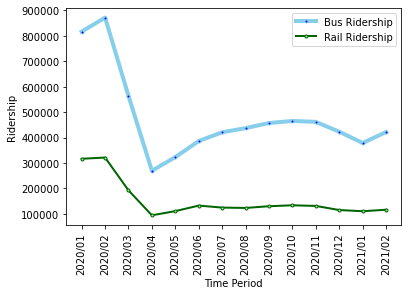

In [37]:
# multiple line plots
plt.plot( 'Time Period', 'Bus Ridership', data=bus_rail, marker='o', markerfacecolor='blue', markersize=3, color='skyblue', linewidth=4)
plt.plot( 'Time Period', 'Rail Ridership', data=bus_rail, marker = 'o', markerfacecolor = 'lightgreen', markersize = 3, color='darkgreen', linewidth=2)
# show legend
plt.legend()

#angle x axis
plt.xticks(rotation =90)
plt.xlabel('Time Period')
plt.ylabel('Ridership')

# show graph
plt.show()

### Metro Surveys

In [38]:
list(survey_race)

['Time Period',
 'Latino',
 'African American',
 'White',
 'API',
 'Native American',
 'Other']

In [39]:
race = px.data.medals_wide()
fig_race = px.bar(survey_race, x="Time Period", y=['Latino',
 'African American',
 'White',
 'API',
 'Native American',
 'Other'], 
             labels = {'value': 'Percent'},
             title="LA Metro Survey: What is your Ethnicity?")
fig_race.show()

In [40]:
list(survey_hhinc)

['Time Period',
 '<$5K',
 '$5K to $10K',
 '$10K to $15K',
 '$15K to $20K',
 '$20K to $25K',
 '$25K to $35K',
 '$35K to $50K',
 '$50K to $100K',
 '$100K+']

In [41]:
hhinc = px.data.medals_wide()
fig_hhinc = px.bar(survey_hhinc, x="Time Period", y=['<$5K',
 '$5K to $10K',
 '$10K to $15K',
 '$15K to $20K',
 '$20K to $25K',
 '$25K to $35K',
 '$35K to $50K',
 '$50K to $100K',
 '$100K+'], 
             labels = {'value': 'Percent'},
             title="LA Metro Survey: What is your Household Income?")
fig_hhinc.show()

In [42]:
list(survey_age)

['Time Period', '<18', '18-24', '25-34', '35-49', '50-64', '65+']

In [43]:
age = px.data.medals_wide()
fig_age = px.bar(survey_age, x="Time Period", y=['<18', '18-24', '25-34', '35-49', '50-64', '65+'], 
             labels = {'value': 'Percent'},
             title="LA Metro Survey: What is your Age?")
fig_age.show()

In [44]:
fig_hhinc.write_html("hhinc.html")
fig_race.write_html("race.html")
fig_age.write_html("age.html")

In [45]:
# create pie charts for access, daw, and withM if you have the time

In [63]:
race2 = px.data.medals_wide()
fig_race2 = px.bar(br_race, x="Mode", y=['Latino',
 'African American',
 'White',
 'API',
 'Native American',
 'Other'], 
             labels = {'value': 'Percent'},
             title="Bus versus Rail: What is your Ethnicity?")
fig_race2.show()

In [68]:
inc = px.data.medals_wide()
fig_inc = px.bar(br_inc, x="Mode", y=['<$5K',
 '$5K to $10K',
 '$10K to $15K',
 '$15K to $20K',
 '$20K to $25K',
 '$25K to $35K',
 '$35K to $50K',
 '$50K to $100K',
 '$100K+'], 
             labels = {'value': 'Percent'},
             title="Bus versus Rail: What is your Household Income?")
fig_inc.show()

In [70]:
access = px.data.medals_wide()
fig_access = px.bar(br_access, x="Mode", y=['Walk', 'Drop off', 'Drive', 'Bike', 'Skateboard', 'Other'], 
             labels = {'value': 'Percent'},
             title="Bus versus Rail: How did you get to the first bus or train of this trip?")
fig_access.show()

In [71]:
fig_inc.write_html("br_inc.html")
fig_race2.write_html("br_race.html")
fig_access.write_html("br_access.html")

## Park Data

In [47]:
# not much new data revealed besides park area through this data
# probably would have been easier to build isochrones data frames from this file, but we selected entrances and exits